# Music genre prediction

**Описание проекта.**
Популярный музыкальный стриминговый сервиса "МиФаСоль" расширяет работу с новыми артистами и музыкантами, в связи с чем возникла задача - правильно классифицировать новые музыкальные треки, чтобы улучшить работу рекомендательной системы. Отдел работы со звуком подготовил датасет, в котором собраны некоторые характеристики музыкальных произведений и их жанры.

**Цель.**
Необходимо разработать модель, позволяющую классифицировать музыкальные произведения по жанрам.

**Описание полей данных.**
- `instance_id` - уникальный идентификатор трека;- `track_name` - название трека;
- `acousticness` - акустичность;
- `danceability` - танцевальность;
- `duration_ms` - продолжительность в милисекундах;
- `energy` - энергичность;
- `instrumentalness` - инструментальность;
- `key` - базовый ключ (нота) произведения;
- `liveness` - привлекательность;
- `loudness` - громкость;
- `mode` - указывает на модальность (мажорную или минорную) трека;
- `speechiness` - выразительность;
- `tempo` - темп;
- `obtained_date` - дата загрузки в сервис;
- `valence` - привлекательность произведения для пользователей сервиса;
- **`music_genre`** - музыкальный жанр (целевой признак).

## Загрузка и ознакомление с данными

Импортируем библиотеки, необходимые для достижения поставленной цели

In [1]:
import numpy as np
import pandas as pd
import ydata_profiling
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, f1_score
from sklearn.model_selection import cross_validate, GridSearchCV, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.impute import KNNImputer
from sklearn.cluster import KMeans
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
import warnings 

In [2]:
# Функция для отображения основной информации о датасете
def get_info(data):
    print(f'Количество признаков: {data.shape[1]}')
    print(f'Количество наблюдений: {data.shape[0]}')
    print('-' * 60)
    print('Основная информация о наборе данных')
    print('-' * 60)
    data.info()
    print('-' * 60)
    print('Первые 5 строк набора данных')
    print('-' * 60)
    display(data.head())

In [3]:
RND = 1

In [4]:
warnings.filterwarnings('ignore')

Загрузим исходные данные

In [5]:
train = pd.read_csv('kaggle_music_genre_train.csv')
test = pd.read_csv('kaggle_music_genre_test.csv')

Посмотрим основные сведения о двух загруженных выборках

In [6]:
get_info(train)

Количество признаков: 16
Количество наблюдений: 20394
------------------------------------------------------------
Основная информация о наборе данных
------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20394 entries, 0 to 20393
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       20394 non-null  float64
 1   track_name        20394 non-null  object 
 2   acousticness      20394 non-null  float64
 3   danceability      20394 non-null  float64
 4   duration_ms       20394 non-null  float64
 5   energy            20394 non-null  float64
 6   instrumentalness  20394 non-null  float64
 7   key               19659 non-null  object 
 8   liveness          20394 non-null  float64
 9   loudness          20394 non-null  float64
 10  mode              19888 non-null  object 
 11  speechiness       20394 non-null  float64
 12  tempo           

,instance_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
0,25143.0,Highwayman,0.4800,0.670,182653.0,0.351,0.017600,D,0.115,-16.842,Major,0.0463,101.384,4-Apr,0.450,Country
1,26091.0,Toes Across The Floor,0.2430,0.452,187133.0,0.670,0.000051,A,0.108,-8.392,Minor,0.0352,113.071,4-Apr,0.539,Rock
2,87888.0,First Person on Earth,0.2280,0.454,173448.0,0.804,0.000000,E,0.181,-5.225,Minor,0.3710,80.980,4-Apr,0.344,Alternative
3,77021.0,No Te Veo - Digital Single,0.0558,0.847,255987.0,0.873,0.000003,G#,0.325,-4.805,Minor,0.0804,116.007,4-Apr,0.966,Hip-Hop
4,20852.0,Chasing Shadows,0.2270,0.742,195333.0,0.575,0.000002,C,0.176,-5.550,Major,0.0487,76.494,4-Apr,0.583,Alternative


In [7]:
get_info(test)

Количество признаков: 15
Количество наблюдений: 5099
------------------------------------------------------------
Основная информация о наборе данных
------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5099 entries, 0 to 5098
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       5099 non-null   int64  
 1   track_name        5099 non-null   object 
 2   acousticness      5099 non-null   float64
 3   danceability      5099 non-null   float64
 4   duration_ms       5099 non-null   float64
 5   energy            5099 non-null   float64
 6   instrumentalness  5099 non-null   float64
 7   key               4941 non-null   object 
 8   liveness          5099 non-null   float64
 9   loudness          5099 non-null   float64
 10  mode              4950 non-null   object 
 11  speechiness       5099 non-null   float64
 12  tempo             4

,instance_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence
0,48564,Low Class Conspiracy,0.301000,0.757,146213.0,0.679,0.00000,A#,0.3030,-7.136,Minor,0.3560,90.361,4-Apr,0.895
1,72394,The Hunter,0.538000,0.256,240360.0,0.523,0.00832,G#,0.0849,-5.175,Major,0.0294,78.385,4-Apr,0.318
2,88081,Hate Me Now,0.005830,0.678,284000.0,0.770,0.00000,A,0.1090,-4.399,Minor,0.2220,90.000,4-Apr,0.412
3,78331,Somebody Ain't You,0.020300,0.592,177354.0,0.749,0.00000,B,0.1220,-4.604,Major,0.0483,160.046,4-Apr,0.614
4,72636,Sour Mango,0.000335,0.421,-1.0,0.447,0.01480,D,0.0374,-8.833,Major,0.2020,73.830,4-Apr,0.121


**Вывод.**
Посмотрев на основную информацию о тренировочном и тестовом наборе данных, можно увидеть, что типы данных в каждом признаке совпадают с ожидаемыми. Кроме того, можно заметить пропуски в данных. Все признаки более подробно разберем в следующей части работы.

## Разведочный анализ данных

Разведочный анализ данных проведем с помощью библиотеки `ydata_profiling`, которая конструирует единый отчет о всех признаках данных. После представим общие выводы.

In [8]:
ydata_profiling.ProfileReport(train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
ydata_profiling.ProfileReport(test)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Отобразим проблемы, которые есть в данных. 
1. `instance_id` - признак, который отображает уникальный идентификатор произведения, не является информативным для будущей спроектированной модели прежсказания жанра музыки. Этот признак будет удален из данных.
2. `track_name` - названия произведений не являются уникальными в наборах данных. Это может быть вызвано вполне тем, что произведения имеют одинаковое названия. Но также есть вероятность, что одно и то же произведение могло попасть в список несколько раз. Стоит это проверить.
3. `acousticness` - акустичность находится в корреляции с другими признаками, такими как энергичность (`energy`) и громкость (`loudness`).
4. `duration_ms` - продолжительность композиции в некоторых случаях принимает значение "-1" (9.9% всех значений тренировочного набора данных и 10% в тестовой выборке), что сложно себе представить, ведь отрицательной продолжительность произведения быть не может. Кроме того, Максимальная длительность композиции в тренировочном наборе данных составляет 75 минут, а в тестовом - 22. Стоит более подробнее исследовать эти аномалии.
5. `energy` - данный признак находится в корреляции с другими признаками, такими как громкость (`loudness`) и акустичность (`acousticness`).
6. `instrumentalness` - значения данного признака принимают нулевые значения (29.3% от всего тренировочного набора данных и 29.6%  всей тестовой выборки).
7. `key` - данный признак имеет пропуски (3.6% тренировочной и 3.1% тестовой выборок).
8. `loudness`- данный признак находится в корреляции с другими признаками, такими как громкость акустичность (`acousticness`) и энергичность (`energy`).
9. `mode` - 2.5% значений пропущены в тренировочной выборке и 2.9% в тестовой выборке.
10. `tempo` - 2.2% значений пропущены в тренировочной выборке и 2.4% в тестовой выборке.
11. `obtained_date` - дата загрузки в сервис не является информативным признаком для будущей спроектированной модели прежсказания жанра музыки. Он будет удален из данных.
12. `music_genre` - в целевом признаке существует дисбаланс классов. Например, объектов, классифицируемых как жанр `Blues` 14% от всей тренировочной выборки, а `Hip-Hop` - 5.6%.

Теперь визуализируем некоторые зависимости признаков. Посмотрим на модальность треков по жанрам.

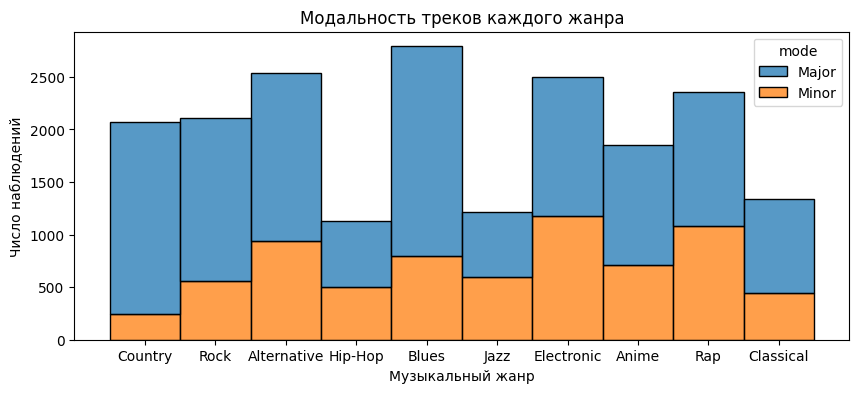

In [6]:
plt.figure(figsize=(10,4))
hist = sns.histplot(data=train, x="music_genre", hue='mode', multiple='stack')
hist.set(title='Модальность треков каждого жанра', xlabel='Музыкальный жанр', ylabel='Число наблюдений')
plt.show()

Видим, что большинстов треков из музыкального жанра Country имеют мажорную модальность. При этом жанры Hip-Hop, Jazz, Electrinic, Rap имеют примерно одинакоковое соотношение мажорных и минорных произведений (50 на 50).

Взглянем на рапсределение танцевальности треков по жанрам.

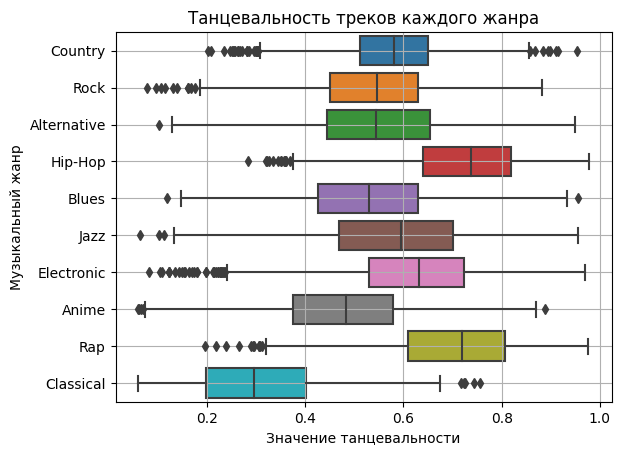

In [7]:
box1 = sns.boxplot(data=train, x="danceability", y="music_genre", hue="music_genre", dodge=False)
box1.set(title='Танцевальность треков каждого жанра', xlabel='Значение танцевальности', ylabel='Музыкальный жанр')
box1.legend().remove()
box1.grid()
plt.show()

Как и предполагалось, большинство классической музыки имеет самую низкую танцевальность. При этом самых высоких значений в этом показателе достигают жанры Hip-Hop и Rap. Стоит отметить, что в каждом жанре есть аномальные значения. Некоторые классические музыкальные произведения танцевальны на том же уровне что и большинство произведений Hip-Hop. 

Посмотрим на темп произведений

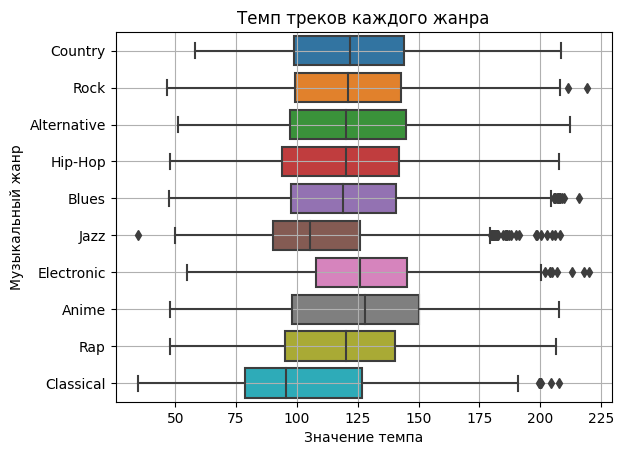

In [8]:
box2 = sns.boxplot(data=train, x="tempo", y="music_genre", hue="music_genre", dodge=False)
box2.set(title='Темп треков каждого жанра', xlabel='Значение темпа', ylabel='Музыкальный жанр')
box2.legend().remove()
box2.grid()
plt.show()

Здесь наблюдаем примерное равенство темпов всех жанров, за исключением классической музыки и джаза, которые показывают немного меньшие значения темпа 

**Вывод.**
В ходе разведочного анализа мы выявили проблемы в данных, такие как неинформативность и мультиколлиниарность признаков, а также аномальные и пропущенные значения в признаках. Кроме того, посмотрели на зависимость некоторых признаков на целевой фактор (жанр произведения).

## Построение базовых моделей и получение базовых метрик качества

В качестве базовых моделей возьмем логистическю регрессию, дерево решений и случайный лес. Для базового функционирования моделей удалим пропуски в данных

In [6]:
train_base = train.copy()
test_base = test.copy()
test_with_id = test.copy()
train_base = train_base.drop(columns=['instance_id', 'track_name', 'obtained_date'])
test_base = test_base.drop(columns=['instance_id', 'track_name', 'obtained_date'])
train_base = train_base.dropna()

In [7]:
def OHE(features, cat):
    ohe = OneHotEncoder(categories='auto', sparse=False)        
    features_enc = ohe.fit_transform(features[cat])        
    if len(cat) == 2:
        columns = np.concatenate([ohe.categories_[0], ohe.categories_[1]]) 
    if len(cat) == 3:
        columns = np.concatenate([ohe.categories_[0], ohe.categories_[1], ohe.categories_[2]])
    if len(cat) == 4:
        columns = np.concatenate([ohe.categories_[0], ohe.categories_[1], ohe.categories_[2], ohe.categories_[3]])
    if len(cat) == 5:
        columns = np.concatenate([ohe.categories_[0], ohe.categories_[1], ohe.categories_[2], ohe.categories_[3], ohe.categories_[4]])
    features[columns] = features_enc        
    features = features.drop(columns=cat)
    return features

def model_metrics(df, category):
    cat = category
    feature = df.drop(['music_genre'], axis=1)
    target = df['music_genre']



    feature = OHE(feature, cat)

    log_reg = LogisticRegression(random_state=RND, multi_class='ovr', class_weight='balanced')
    log_results = cross_validate(log_reg, feature, target, cv=5, scoring=['f1_macro', 'accuracy'])
    log_f1 = log_results['test_f1_macro'].mean()
    log_accuracy = log_results['test_accuracy'].mean()

    tree = DecisionTreeClassifier(random_state=RND, class_weight='balanced')
    tree_results = cross_validate(tree, feature, target, cv=5, scoring=['f1_macro', 'accuracy'])
    tree_f1 = tree_results['test_f1_macro'].mean()
    tree_accuracy = tree_results['test_accuracy'].mean()

    forest = RandomForestClassifier(random_state=RND, class_weight='balanced')
    forest_results = cross_validate(forest, feature, target, cv=5, scoring=['f1_macro', 'accuracy'])
    forest_f1 = forest_results['test_f1_macro'].mean()
    forest_accuracy = forest_results['test_accuracy'].mean()
    
    return pd.DataFrame({'LogRegr': [log_f1, log_accuracy], 
                         'DecisionTree': [tree_f1, tree_accuracy], 
                         'RandomForest':[forest_f1, forest_accuracy]}, index=['F1_score', 'Accuracy_score'])

In [25]:
model_metrics(train_base, ['key', 'mode'])

,LogRegr,DecisionTree,RandomForest
F1_score,0.115130,0.320172,0.415782
Accuracy_score,0.168125,0.314440,0.452864


Таким образом установили базовые значения метрик для набора данных. Далее попробуем внести корректировки в наш датасет для улучшения качества предсказаний.

## Предобработка данных

### Дубликаты

In [8]:
print('Число дубликатов в данных:', train.duplicated().sum())

Число дубликатов в данных: 0


На первый взгляд одинаковых записей в данных нет. Приведем один пример, опровергающий это.

In [9]:
train[train['track_name'] == 'The Bends']

,instance_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
460,38494.0,The Bends,0.0381,0.512,94547.0,0.576,0.0365,G#,0.198,-4.238,Minor,0.2830,75.978,4-Apr,0.319,Rap
676,84391.0,The Bends,0.0381,0.512,94547.0,0.576,0.0365,G#,0.198,-4.238,Minor,0.2830,75.978,4-Apr,0.319,Alternative
15944,37569.0,The Bends,0.0117,0.288,246200.0,0.757,0.1400,C,0.363,-8.065,Major,0.0652,89.694,4-Apr,0.311,Alternative


Видим, что 1 и 2 строчка идентичны только по столбцам `instance_id` и `music_genre`. Т.е. одна и та же песня была отнесена к разным жанрам. Это будет сбивать модель предсказаний, поэтому с этими аномалиями необходимо бороться. 

In [10]:
train.duplicated(subset=['track_name', 'acousticness', 'danceability', 'energy', 
                         'instrumentalness', 'liveness', 'loudness', 
                         'speechiness', 'obtained_date', 'valence']).sum()

688

Всего нашли 688 дублирующих строк. Стоит заметить, что некоторые столбцы не учитывались в поиске дубликатов, т.к. они имеют пропуски и могут создать ненужную идентичность. Удалим эти дубликаты.

In [11]:
train = train.drop_duplicates(subset=['track_name', 'acousticness', 'danceability', 'energy', 
                         'instrumentalness', 'liveness', 'loudness', 
                         'speechiness', 'obtained_date', 'valence']).reset_index(drop=True)

Удалим теперь неинформативные признаки

In [12]:
train = train.drop(['instance_id', 'track_name', 'obtained_date'], axis=1)

In [13]:
without_dupl = train.copy()
without_dupl

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,music_genre
0,0.48000,0.670,182653.0,0.351,0.017600,D,0.1150,-16.842,Major,0.0463,101.384,0.450,Country
1,0.24300,0.452,187133.0,0.670,0.000051,A,0.1080,-8.392,Minor,0.0352,113.071,0.539,Rock
2,0.22800,0.454,173448.0,0.804,0.000000,E,0.1810,-5.225,Minor,0.3710,80.980,0.344,Alternative
3,0.05580,0.847,255987.0,0.873,0.000003,G#,0.3250,-4.805,Minor,0.0804,116.007,0.966,Hip-Hop
4,0.22700,0.742,195333.0,0.575,0.000002,C,0.1760,-5.550,Major,0.0487,76.494,0.583,Alternative
...,...,...,...,...,...,...,...,...,...,...,...,...,...
19701,0.71900,0.725,-1.0,0.483,0.000000,NaN,0.0797,-13.314,Minor,0.0438,87.413,0.942,Jazz
19702,0.19000,0.482,198933.0,0.362,0.005620,F#,0.0913,-10.358,Minor,0.0299,76.879,0.174,Rock
19703,0.00061,0.663,220947.0,0.886,0.000025,D,0.2840,-4.149,Major,0.0358,146.803,0.942,Alternative
19704,0.00310,0.914,162214.0,0.515,0.000000,C#,0.1050,-9.934,Major,0.3560,150.016,0.215,Rap


In [14]:
without_dupl = without_dupl.dropna()

Посмотрим на метрики

In [49]:
model_metrics(without_dupl, ['key', 'mode'])

,LogRegr,DecisionTree,RandomForest
F1_score,0.108169,0.340745,0.427456
Accuracy_score,0.164964,0.339536,0.474743


Видим, что метрики дерева решений и слечайного леса поднялись

### Использование KNNImputer 

Создадим копию данных

In [15]:
first_train = train.copy()
first_train

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,music_genre
0,0.48000,0.670,182653.0,0.351,0.017600,D,0.1150,-16.842,Major,0.0463,101.384,0.450,Country
1,0.24300,0.452,187133.0,0.670,0.000051,A,0.1080,-8.392,Minor,0.0352,113.071,0.539,Rock
2,0.22800,0.454,173448.0,0.804,0.000000,E,0.1810,-5.225,Minor,0.3710,80.980,0.344,Alternative
3,0.05580,0.847,255987.0,0.873,0.000003,G#,0.3250,-4.805,Minor,0.0804,116.007,0.966,Hip-Hop
4,0.22700,0.742,195333.0,0.575,0.000002,C,0.1760,-5.550,Major,0.0487,76.494,0.583,Alternative
...,...,...,...,...,...,...,...,...,...,...,...,...,...
19701,0.71900,0.725,-1.0,0.483,0.000000,NaN,0.0797,-13.314,Minor,0.0438,87.413,0.942,Jazz
19702,0.19000,0.482,198933.0,0.362,0.005620,F#,0.0913,-10.358,Minor,0.0299,76.879,0.174,Rock
19703,0.00061,0.663,220947.0,0.886,0.000025,D,0.2840,-4.149,Major,0.0358,146.803,0.942,Alternative
19704,0.00310,0.914,162214.0,0.515,0.000000,C#,0.1050,-9.934,Major,0.3560,150.016,0.215,Rap


Перед тем как использовать метод k ближайших соседей, закодируем категориальные признаки

In [16]:
label_key = LabelEncoder()
first_train['key'] = label_key.fit_transform(first_train['key'])
first_train['key'] = first_train['key'].where(first_train['key']!=12, np.nan)

In [17]:
label_mode = LabelEncoder()
first_train['mode'] = label_mode.fit_transform(first_train['mode'])
first_train['mode'] = first_train['mode'].where(first_train['mode']!=2, np.nan)

Теперь восстановим пропущенные значение методом k ближайших соседей

In [18]:
droped = first_train['music_genre']

In [19]:
imputer = KNNImputer(n_neighbors=5, weights="uniform")
first_train = pd.DataFrame(imputer.fit_transform(first_train.drop(['music_genre'], axis=1)), 
                           columns=first_train.drop(['music_genre'], axis=1).columns)
first_train['music_genre'] = droped

Вернем категориальные признаки к исходному состоянию

In [20]:
first_train['key'] = np.int_(np.round(first_train['key']))
first_train['mode'] = np.int_(np.round(first_train['mode']))

In [21]:
first_train['key'] = label_key.inverse_transform(first_train['key'])
first_train['mode'] = label_mode.inverse_transform(first_train['mode'])

Посмотрим на получившиеся метрики

In [108]:
model_metrics(first_train, ['key', 'mode'])

,LogRegr,DecisionTree,RandomForest
F1_score,0.117093,0.335417,0.427339
Accuracy_score,0.171673,0.334213,0.475338


Видим, что качество логистической регресси немного повысилось, при этом "деревянные" модели почти не почувтсвовали заполнение пропусков данным методом. Попробуем теперь заполнить пропуски медианой (для количественных признаков) и модой (для количественных признаков)

### Использование моды и медианы

Делаем новую копию данных

In [21]:
second_train_best = train.copy()
second_train_best

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,music_genre
0,0.48000,0.670,182653.0,0.351,0.017600,D,0.1150,-16.842,Major,0.0463,101.384,0.450,Country
1,0.24300,0.452,187133.0,0.670,0.000051,A,0.1080,-8.392,Minor,0.0352,113.071,0.539,Rock
2,0.22800,0.454,173448.0,0.804,0.000000,E,0.1810,-5.225,Minor,0.3710,80.980,0.344,Alternative
3,0.05580,0.847,255987.0,0.873,0.000003,G#,0.3250,-4.805,Minor,0.0804,116.007,0.966,Hip-Hop
4,0.22700,0.742,195333.0,0.575,0.000002,C,0.1760,-5.550,Major,0.0487,76.494,0.583,Alternative
...,...,...,...,...,...,...,...,...,...,...,...,...,...
19701,0.71900,0.725,-1.0,0.483,0.000000,NaN,0.0797,-13.314,Minor,0.0438,87.413,0.942,Jazz
19702,0.19000,0.482,198933.0,0.362,0.005620,F#,0.0913,-10.358,Minor,0.0299,76.879,0.174,Rock
19703,0.00061,0.663,220947.0,0.886,0.000025,D,0.2840,-4.149,Major,0.0358,146.803,0.942,Alternative
19704,0.00310,0.914,162214.0,0.515,0.000000,C#,0.1050,-9.934,Major,0.3560,150.016,0.215,Rap


Заполняем пропуски

In [22]:
second_train_best['key'] = second_train_best['key'].fillna(second_train_best['key'].mode()[0])
second_train_best['mode'] = second_train_best['mode'].fillna(second_train_best['mode'].mode()[0])
second_train_best['tempo'] = second_train_best['tempo'].fillna(second_train_best['tempo'].median())

Считаем метрики

In [27]:
model_metrics(second_train_best, ['key', 'mode'])

,LogRegr,DecisionTree,RandomForest
F1_score,0.118089,0.339243,0.430882
Accuracy_score,0.171572,0.337562,0.477876


In [28]:
second_train = second_train_best.copy()

In [271]:
second_train['duration_ms'] = second_train['duration_ms'].where(second_train['duration_ms']!=-1, second_train['duration_ms'].median())

In [273]:
model_metrics(second_train, ['key', 'mode'])

,LogRegr,DecisionTree,RandomForest
F1_score,0.106331,0.337728,0.430001
Accuracy_score,0.150867,0.337207,0.476404


Видим, что заполнение пропусков медианой у количественных признаков и модой у категориальных дает чуть больший прирост в метриках. В дальнейшем будем использовать набор данных с заполненными пропусками именно этим методом.

### Создание новых признаков

В качестве идеи первого признака возьмем разбиение песен на категории по длительности произведения. Сначала удалим выбросы в столбце `duration_ms`, а именно значения -1.

In [224]:
second_train['duration_ms'] = second_train['duration_ms'].where(second_train['duration_ms']!=-1, np.nan)

In [225]:
label_key = LabelEncoder()
second_train['key'] = label_key.fit_transform(second_train['key'])

label_mode = LabelEncoder()
second_train['mode'] = label_mode.fit_transform(second_train['mode'])

In [226]:
droped = second_train['music_genre']
imputer = KNNImputer(n_neighbors=5, weights="uniform")
second_train = pd.DataFrame(imputer.fit_transform(second_train.drop(['music_genre'], axis=1)), 
                           columns=second_train.drop(['music_genre'], axis=1).columns)
second_train['music_genre'] = droped

In [227]:
second_train['key'] = label_key.inverse_transform(np.int_(second_train['key']))
second_train['mode'] = label_mode.inverse_transform(np.int_(second_train['mode']))

In [228]:
second_train.head()

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,music_genre
0,0.4800,0.670,182653.0,0.351,0.017600,D,0.115,-16.842,Major,0.0463,101.384,0.450,Country
1,0.2430,0.452,187133.0,0.670,0.000051,A,0.108,-8.392,Minor,0.0352,113.071,0.539,Rock
2,0.2280,0.454,173448.0,0.804,0.000000,E,0.181,-5.225,Minor,0.3710,80.980,0.344,Alternative
3,0.0558,0.847,255987.0,0.873,0.000003,G#,0.325,-4.805,Minor,0.0804,116.007,0.966,Hip-Hop
4,0.2270,0.742,195333.0,0.575,0.000002,C,0.176,-5.550,Major,0.0487,76.494,0.583,Alternative


Посмотрим, как лучше разбить промежутки длительности произведения. Для этого посторим гистограмму и статистическое распределение этого признака

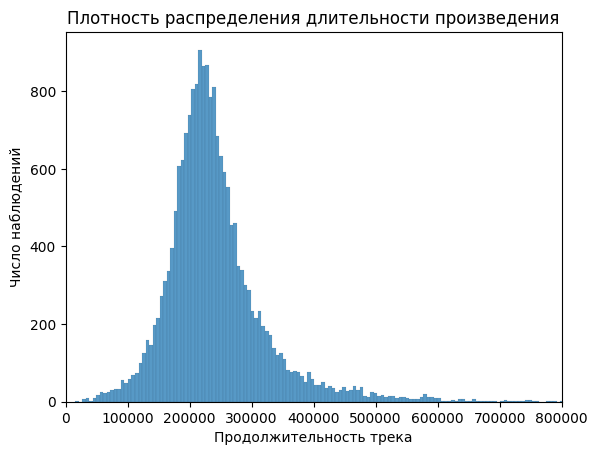

In [229]:
hist_dur = sns.histplot(data=second_train, x="duration_ms")
hist_dur.set(xlim=(0, .8e6), xlabel='Продолжительность трека', ylabel='Число наблюдений', title='Плотность распределения длительности произведения')
plt.show()

In [180]:
second_train['duration_ms'].describe()

count    1.970600e+04
mean     2.446260e+05
std      1.059189e+05
min      1.550900e+04
25%      1.945878e+05
50%      2.283700e+05
75%      2.711502e+05
max      4.497994e+06
Name: duration_ms, dtype: float64

Можно категории разделить следующим образом: песни продолжительностью до 90000мс (1.5мин) - это категория `very_short`, от 90000мс до 150000мс (2.5 мин) - `short`, от 150000мс до 200000мс (3.3мин) - `normal`, от 200000мс до 250000мс (4.17 мин) - `normal+`, от 250000мс до 300000мс (5 мин) - `pre_high`,  от 300000мс до 450000мс (7.5 мин) - `high`, от 450000мс до 600000мс (10 мин) - `very_high`, более 600000 - `too_much`.

In [230]:
def category(value):
    if value < 9e4:
        return 'very_short'
    elif 9e4 <= value < 15e4:
        return 'short'
    elif 15e4 <= value < 20e4:
        return 'normal'
    elif 20e4 <= value < 25e4:
        return 'normal+'
    elif 25e4 <= value < 30e4:
        return 'pre_high'
    elif 30e4 <= value < 45e4:
        return 'high'
    elif 45e4 <= value < 60e4:
        return 'very_high'
    elif 60e4 <= value:
        return 'too_much'

In [231]:
second_train['duration_category'] = second_train['duration_ms'].map(category)
second_train

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,music_genre,duration_category
0,0.48000,0.670,182653.0,0.351,0.017600,D,0.1150,-16.842,Major,0.0463,101.384,0.450,Country,normal
1,0.24300,0.452,187133.0,0.670,0.000051,A,0.1080,-8.392,Minor,0.0352,113.071,0.539,Rock,normal
2,0.22800,0.454,173448.0,0.804,0.000000,E,0.1810,-5.225,Minor,0.3710,80.980,0.344,Alternative,normal
3,0.05580,0.847,255987.0,0.873,0.000003,G#,0.3250,-4.805,Minor,0.0804,116.007,0.966,Hip-Hop,pre_high
4,0.22700,0.742,195333.0,0.575,0.000002,C,0.1760,-5.550,Major,0.0487,76.494,0.583,Alternative,normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19701,0.71900,0.725,286121.6,0.483,0.000000,G,0.0797,-13.314,Minor,0.0438,87.413,0.942,Jazz,pre_high
19702,0.19000,0.482,198933.0,0.362,0.005620,F#,0.0913,-10.358,Minor,0.0299,76.879,0.174,Rock,normal
19703,0.00061,0.663,220947.0,0.886,0.000025,D,0.2840,-4.149,Major,0.0358,146.803,0.942,Alternative,normal+
19704,0.00310,0.914,162214.0,0.515,0.000000,C#,0.1050,-9.934,Major,0.3560,150.016,0.215,Rap,normal


In [232]:
second_train = second_train.drop(['duration_ms'], axis=1)

In [233]:
model_metrics(second_train, ['key', 'mode', 'duration_category'])

,LogRegr,DecisionTree,RandomForest
F1_score,0.369811,0.334245,0.425474
Accuracy_score,0.378007,0.334568,0.471938


Попробуем провести кластеризацию всех произведений, не учитывая целевой признак. Значения кластеров возьмем как новый признак. Он будет говорит о схожести произведений. Перед этим проведем стандартизацию количественных признаков

In [234]:
num = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'valence']
scaler = StandardScaler()
second_train[num] = scaler.fit_transform(second_train[num])
second_train.head()

,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,music_genre,duration_category
0,0.624613,0.635566,-1.077381,-0.472002,D,-0.499154,-1.481622,Major,-0.455122,-0.649738,-0.055681,Country,normal
1,-0.107955,-0.630822,0.184649,-0.528749,A,-0.540968,0.038917,Minor,-0.569329,-0.261995,0.309238,Rock,normal
2,-0.154320,-0.619204,0.714781,-0.528913,E,-0.104915,0.608804,Minor,2.885706,-1.326689,-0.490305,Alternative,normal
3,-0.686590,1.663780,0.987759,-0.528903,G#,0.755243,0.684381,Minor,-0.104268,-0.164586,2.060032,Hip-Hop,pre_high
4,-0.157411,1.053823,-0.191191,-0.528908,C,-0.134782,0.550322,Major,-0.430428,-1.475522,0.489648,Alternative,normal


Теперь проведем кластеризацию

In [235]:
second_train_ohe = second_train.copy()
second_train_ohe = OHE(second_train_ohe, ['key', 'mode', 'duration_category'])

In [236]:
kmeans = KMeans(n_clusters=10, random_state=RND, n_init="auto").fit(second_train_ohe.drop(['music_genre'], axis=1))
pred = kmeans.predict(second_train_ohe.drop(['music_genre'], axis=1))

In [237]:
second_train['clusters'] = pred.astype('str')
second_train.head()

,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,music_genre,duration_category,clusters
0,0.624613,0.635566,-1.077381,-0.472002,D,-0.499154,-1.481622,Major,-0.455122,-0.649738,-0.055681,Country,normal,5
1,-0.107955,-0.630822,0.184649,-0.528749,A,-0.540968,0.038917,Minor,-0.569329,-0.261995,0.309238,Rock,normal,9
2,-0.154320,-0.619204,0.714781,-0.528913,E,-0.104915,0.608804,Minor,2.885706,-1.326689,-0.490305,Alternative,normal,3
3,-0.686590,1.663780,0.987759,-0.528903,G#,0.755243,0.684381,Minor,-0.104268,-0.164586,2.060032,Hip-Hop,pre_high,1
4,-0.157411,1.053823,-0.191191,-0.528908,C,-0.134782,0.550322,Major,-0.430428,-1.475522,0.489648,Alternative,normal,5


In [238]:
model_metrics(second_train, ['key', 'mode', 'duration_category', 'clusters'])

,LogRegr,DecisionTree,RandomForest
F1_score,0.393174,0.337478,0.421689
Accuracy_score,0.400437,0.336599,0.468842


Создадим признак `contain_#`, который будет указывать на наличие диеза в базовой ноте произведения

In [239]:
second_train['contain_#'] = second_train['key'].str.contains('#') * 1
second_train.head()

,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,music_genre,duration_category,clusters,contain_#
0,0.624613,0.635566,-1.077381,-0.472002,D,-0.499154,-1.481622,Major,-0.455122,-0.649738,-0.055681,Country,normal,5,0
1,-0.107955,-0.630822,0.184649,-0.528749,A,-0.540968,0.038917,Minor,-0.569329,-0.261995,0.309238,Rock,normal,9,0
2,-0.154320,-0.619204,0.714781,-0.528913,E,-0.104915,0.608804,Minor,2.885706,-1.326689,-0.490305,Alternative,normal,3,0
3,-0.686590,1.663780,0.987759,-0.528903,G#,0.755243,0.684381,Minor,-0.104268,-0.164586,2.060032,Hip-Hop,pre_high,1,1
4,-0.157411,1.053823,-0.191191,-0.528908,C,-0.134782,0.550322,Major,-0.430428,-1.475522,0.489648,Alternative,normal,5,0


Теперь посмотрим на метрики

In [240]:
model_metrics(second_train, ['key', 'mode', 'duration_category', 'clusters'])

,LogRegr,DecisionTree,RandomForest
F1_score,0.393089,0.335992,0.419614
Accuracy_score,0.400386,0.335533,0.465442


Можно заметить, что предсказания логистической регрессии немного улучшились. Деревья предсказывают немного хуже. Т.к. мы бдуем ориентироваться на "деревянные модели" и в дальнейшем будем использовать бустинговые модели, то выберем предобработку, показывающую наилучшую метрику у случайного леса. Такая метрика достигается при заполнении пропусков медианой и модой. Добавление признаков дает ухудшение метрики.

## Оптимизация моделей

Произведем настройку гиперпараметров некоторых моделей

### Случайный лес

In [23]:
second_train_best_log = second_train_best.copy()
second_train_best_log = OHE(second_train_best_log, ['key', 'mode']) 
second_train_best_features = second_train_best_log.drop(['music_genre'], axis=1)
second_train_best_target = second_train_best_log['music_genre']

In [ ]:
param_grid = {
    'n_estimators':range(10, 201, 10),
    'max_depth':range(1, 30, 2)
}

model = RandomForestClassifier(random_state=RND, class_weight='balanced', n_jobs=-1)
grid_forest = RandomizedSearchCV(model, param_grid, cv=5, scoring='f1_macro', n_iter=100)
grid_forest.fit(second_train_best_features, second_train_best_target)
forest_f1 = round(grid_forest.best_score_, 4)
print('Наилучшая конфигурация модели:', grid_forest.best_params_)
print('Наилучшее значение метрики F1:', grid_forest.best_score_)

Обратимся теперь к бустинговым моделям

### CatBoost

In [25]:
train_features_catb = second_train_best.drop(['music_genre'], axis=1)
train_target_catb = second_train_best['music_genre']

In [258]:
param_grid_cat = {
    'learning_rate': [0.001, 0.01, 0.1, 0.3, 0.7],
    'l2_leaf_reg': [1, 3],
    'bootstrap_type': ['Bayesian', 'Bernoulli'],
    'depth': [2, 3, 4, 5, 6]
}

In [259]:
cat = CatBoostClassifier(random_state=RND, cat_features=['key', 'mode'], loss_function='MultiClass', auto_class_weights='Balanced')
grid_cat = RandomizedSearchCV(cat, param_grid_cat, cv=5, scoring='f1_macro', n_iter=30)
grid_cat.fit(train_features_catb, train_target_catb, verbose=0)
cat_f1 = round(grid_cat.best_score_, 4)
print('Наилучшая конфигурация модели:', grid_cat.best_params_)
print('Наилучшее значение метрики F1:', grid_cat.best_score_)

Наилучшая конфигурация модели: {'learning_rate': 0.1, 'l2_leaf_reg': 1, 'depth': 4, 'bootstrap_type': 'Bernoulli'}
Наилучшее значение метрики F1: 0.46080080744531815


### LightGBM

In [27]:
train_features_catb['key'] = train_features_catb['key'].astype('category')
train_features_catb['mode'] = train_features_catb['mode'].astype('category')

In [28]:
param_grid_lgbm = {
    'boosting_type': ['gbdt', 'dart', 'rf'],
    'num_leaves': [10, 17, 22, 28, 31,],
    'max_depth': [-1, 5, 10, 15],
    'learning_rate': [0.001, 0.01, 0.05, 0.1, 0.3, 0.5, 0.7, 1],
    'n_estimators': range(50, 151, 20),
}

In [29]:
lgbm = LGBMClassifier(random_state=RND, categorical_feature=['key', 'mode'], objective='multiclass', class_weight='balanced', verbose=-1)
grid_lgbm = RandomizedSearchCV(lgbm, param_grid_lgbm, cv=5, scoring='f1_macro', n_iter=100)
grid_lgbm.fit(train_features_catb, train_target_catb)
lgbm_f1 = round(grid_lgbm.best_score_, 4)
print('Наилучшая конфигурация модели:', grid_lgbm.best_params_)
print('Наилучшее значение метрики F1:', grid_lgbm.best_score_)

Наилучшая конфигурация модели: {'num_leaves': 10, 'n_estimators': 150, 'max_depth': -1, 'learning_rate': 0.3, 'boosting_type': 'dart'}
Наилучшее значение метрики F1: 0.45425954568515764


Наилучшую метрику F1 показала модель CatBoost. Ее и будем использовать для предсказаний.

## Подготовка тренировочного набора данных

Подготовим тестовый набор данных в соответствии с предобработкой тренировочного набора данных

In [30]:
test_base['key'] = test_base['key'].fillna(test_base['key'].mode()[0])
test_base['mode'] = test_base['mode'].fillna(test_base['mode'].mode()[0])
test_base['tempo'] = test_base['tempo'].fillna(test_base['tempo'].median())

Обучим модель и предскажем целевой признак на тестовой выборке

In [32]:
total_model = CatBoostClassifier(random_state=RND, cat_features=['key', 'mode'], 
                                 loss_function='MultiClass', auto_class_weights='Balanced',
                                learning_rate=0.1, l2_leaf_reg=1, depth=4, bootstrap_type='Bernoulli')
total_model.fit(train_features_catb, train_target_catb, verbose=0)
total_pred_cat = total_model.predict(test_base)

0:	learn: 2.1968999	total: 209ms	remaining: 3m 28s
1:	learn: 2.1144941	total: 245ms	remaining: 2m 2s
2:	learn: 2.0536680	total: 281ms	remaining: 1m 33s
3:	learn: 2.0038405	total: 319ms	remaining: 1m 19s
4:	learn: 1.9606726	total: 354ms	remaining: 1m 10s
5:	learn: 1.9259251	total: 391ms	remaining: 1m 4s
6:	learn: 1.8894434	total: 429ms	remaining: 1m
7:	learn: 1.8662947	total: 471ms	remaining: 58.4s
8:	learn: 1.8431863	total: 508ms	remaining: 56s
9:	learn: 1.8199101	total: 545ms	remaining: 54s
10:	learn: 1.7981610	total: 581ms	remaining: 52.3s
11:	learn: 1.7804567	total: 615ms	remaining: 50.7s
12:	learn: 1.7622868	total: 653ms	remaining: 49.6s
13:	learn: 1.7436299	total: 686ms	remaining: 48.3s
14:	learn: 1.7269878	total: 720ms	remaining: 47.3s
15:	learn: 1.7142724	total: 755ms	remaining: 46.4s
16:	learn: 1.7011002	total: 789ms	remaining: 45.6s
17:	learn: 1.6885365	total: 823ms	remaining: 44.9s
18:	learn: 1.6767188	total: 871ms	remaining: 45s
19:	learn: 1.6666750	total: 906ms	remaining: 4

Занесем предсказания в результирующий файл

In [33]:
output = pd.DataFrame({'instance_id': test_with_id['instance_id'], # Вывод предсказаний в csv файл
                       'music_genre': total_pred_cat.reshape(-1)}) 
output.to_csv('submission.csv', index=False)

На Kagle метрика fbeta_score достигла значения 0.45. Посмотрим на значимость признаков

In [40]:
importance = pd.DataFrame(total_model.feature_importances_, index=total_model.feature_names_, 
                          columns=['Значимость признака']).sort_values(by='Значимость признака', ascending=False)
importance

,Значимость признака
danceability,14.427023
instrumentalness,14.197965
speechiness,13.659683
acousticness,10.642242
loudness,10.107714
valence,8.135680
energy,7.906450
duration_ms,6.384829
key,5.182730
tempo,4.479611


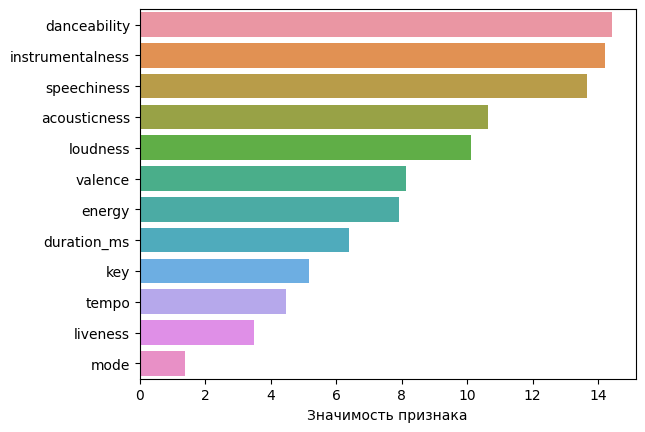

In [53]:
hist_imp = sns.barplot(data=importance, y=importance.index, x='Значимость признака')
plt.show()

Видим, что самыми значимыми признаками для итоговой модели оказались `danceability`, `instrumentalness` и `speechiness`

## Выводы

Исходными данными была выборка с характеристиками различных музыкальных произведений. В ходе работы был произведен разведочный анализ данных, по результатам которого были выявлены различные аномалии в данных, такие как пропуски, неадекватные значения и т.д. 

На данных так же были испытаны различные способы устранение аномалий, наилучшим из которых показал себя заполенение пропусков в категориальных признаках модой, а в количественных - медианой. Добавление новых признаков не вызвало повышение итоговой метрики, поэтому состав данных не поменялся. 

Наилучшие результаты в предсказании целевого признака показала модель CatBoost